# Homework 6
## 姓名：王宝琪  学号：22210980075
## 第一部分：五大联赛数据集分析

### 1. 读入五大联赛数据集

In [1]:
import pandas as pd#导包
import numpy as np
import matplotlib.pyplot as plt
plt.rcParams['font.sans-serif']='SimHei'#中文正常显示
%matplotlib inline

In [2]:
soccer=pd.read_csv("soccer.csv")#读入数据
soccer.head()#查看数据前五行

,Unnamed: 0,球员,身价,射门,射正,进球,偷球,关键传球,带球摆脱,助攻,被侵犯,解围,拦截,封堵,头球,铲断
0,1,托马斯,180.0,32,9,5,15,8,5,1,13,11,5,5,47,15
1,2,M.加西亚,162.0,30,7,2,27,12,12,1,53,59,26,7,107,83
2,3,马丁阿古拉甘,135.0,1,0,0,10,8,25,0,28,56,26,11,20,42
3,4,伊利,540.0,2,1,0,0,2,0,0,2,25,8,7,24,7
4,5,迭戈.罗兰,315.0,10,2,0,15,5,12,0,17,8,4,0,9,13


In [3]:
soccer.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1563 entries, 0 to 1562
Data columns (total 16 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  1563 non-null   int64  
 1   球员          1563 non-null   object 
 2   身价          1563 non-null   float64
 3   射门          1563 non-null   int64  
 4   射正          1563 non-null   int64  
 5   进球          1563 non-null   int64  
 6   偷球          1563 non-null   int64  
 7   关键传球        1563 non-null   int64  
 8   带球摆脱        1563 non-null   int64  
 9   助攻          1563 non-null   int64  
 10  被侵犯         1563 non-null   int64  
 11  解围          1563 non-null   int64  
 12  拦截          1563 non-null   int64  
 13  封堵          1563 non-null   int64  
 14  头球          1563 non-null   int64  
 15  铲断          1563 non-null   int64  
dtypes: float64(1), int64(14), object(1)
memory usage: 195.5+ KB


### 2. 绘制自变量的相关系数图并解读

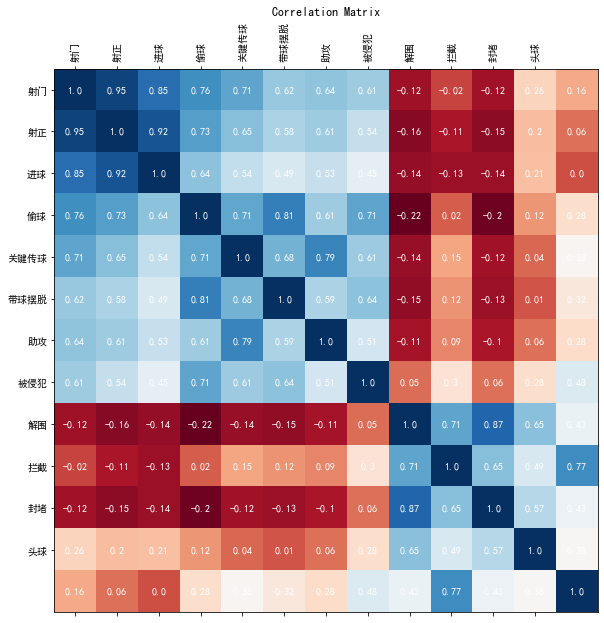

In [3]:
# 2. 绘制自变量的相关系数图并解读
corr_matrix = soccer.drop(["身价","Unnamed: 0"], axis=1).corr()
fig, ax = plt.subplots(figsize=(10, 10))
ax.matshow(corr_matrix, cmap=plt.cm.RdBu)
for i in range(corr_matrix.shape[0]):
    for j in range(corr_matrix.shape[1]):
        text = ax.text(j, i, round(corr_matrix.iloc[i, j],2), ha="center", va="center", color="w")
plt.xticks(range(len(corr_matrix.columns)-1), corr_matrix.columns[:-1], rotation=90)
plt.yticks(range(len(corr_matrix.columns)-1), corr_matrix.columns[:-1])
plt.title("Correlation Matrix")
plt.show()

自变量的相关系数图如上所示。可以看到，射门，射正，进球，偷球，关键传球，带球摆脱，助攻，被侵犯之间有正相关关系，对足球运动员在比赛场上的表现有积极影响；解围，拦截，封堵三项与其他自变量呈负相关，彼此之间正相关；头球和铲断同其他变量的相关关系较弱。

### 3. 对所有的自变量（除身价外）进行主成分分析，选择主成分个数时使用碎石图的方法，并对结果进行解读

C:\Users\86131\anaconda3\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


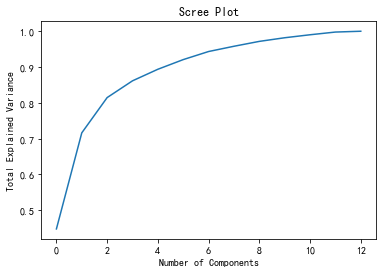

In [4]:
# 3. 对所有的自变量（除身价外）进行主成分分析
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

# 将 DataFrame 转化为 numpy 数组
X = soccer.drop(["身价","Unnamed: 0","球员"], axis=1).values
# 对自变量进行标准化处理，使得所有特征均值为0，方差为1
X = StandardScaler().fit_transform(X)

# 使用 PCA 进行主成分分析，选择主成分个数时使用碎石图的方法
pca = PCA()
pca.fit(X)

# 绘制碎石图
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Total Explained Variance')
plt.title('Scree Plot')
plt.show()

碎石图如上所示。这里使用前2个主成分，其已解释接近80%的方差

### 4. 计算每一位球员的主成分得分，并挑选几位球员进行解读

In [5]:
# 4. 根据任务2的结果，计算每一位球员的主成分得分，并挑选几位球员进行解读
# 使用前2个主成分对样本进行变换
X_transformed = pca.transform(X)[:, :2]

# 将主成分得分添加到原数据框中
soccer["PC1"] = X_transformed[:,0]
soccer["PC2"] = X_transformed[:,1]

# 选择前 5 个球员进行解读
print(soccer[["身价", "PC1", "PC2"]].sort_values(by="身价", ascending=False).head())

           身价        PC1       PC2
125   18000.0   9.125462 -3.274979
136   16200.0   5.406889 -2.155318
1332  13500.0   5.831928 -1.533682
853   13500.0   0.351158 -1.643836
778   13500.0  10.604183 -2.962929


In [7]:
# 查找运动员号码为 778 的运动员
print(soccer[soccer["Unnamed: 0"]==778])

     Unnamed: 0  球员      身价  射门  射正  进球  偷球  关键传球  带球摆脱  助攻  被侵犯  解围  拦截  封堵  \
713         778  沃兰  2250.0  88  46  14  58    43    28   9   51  32   8   2   

     头球  铲断       PC1       PC2  
713  34  30  6.511951 -1.193035  


前五个球员的身价和身价和主成分如上所示。其中第一主成分比较重要，在所有解释变量中，它所占的权重较大。取PC1和PC2较大的球员：778号进行查看，我们可以看到，他是一个比较全面的中场球员，既能够带球也善于组织进攻。他的身价说明了他在比赛场上表现非常优异。

### 5. 使用计算得到的主成分得分，对足球运动员进行 K-means 聚类，并对结果进行解读

In [9]:
# 5. 使用计算得到的主成分得分，对足球运动员进行 K-means 聚类，并对结果进行解读
from sklearn.cluster import KMeans

# 前 2个主成分作为聚类变量
X_cluster = soccer[["PC1", "PC2"]].values

# 将主成分得分进行标准化处理
X_cluster = StandardScaler().fit_transform(X_cluster)

# 选择 k = 3 作为聚类数
kmeans = KMeans(n_clusters=3,random_state=2023)
kmeans.fit(X_cluster)

# 将聚类结果添加到原数据框
soccer["cluster"] = kmeans.labels_

# 统计各个聚类的样本数
n_clusters = len(np.unique(kmeans.labels_))
sizes = [np.sum(kmeans.labels_ == i) for i in range(n_clusters)]
print("Cluster Sizes:", sizes)
print(soccer.groupby("cluster").mean())

Cluster Sizes: [450, 784, 329]
         Unnamed: 0           身价         射门         射正        进球         偷球  \
cluster                                                                       
0        868.540000  1189.982222  17.331111   4.740000  1.355556  13.368889   
1        857.265306   725.561990  11.066327   3.571429  1.019133   9.809949   
2        829.559271  2444.541033  58.905775  22.790274  7.604863  43.902736   

              关键传球       带球摆脱        助攻        被侵犯         解围         拦截  \
cluster                                                                    
0        14.944444  12.302222  1.388889  23.913333  83.902222  39.600000   
1         8.596939   7.553571  0.727041  10.992347  14.429847   9.262755   
2        39.881459  35.015198  4.468085  39.054711  16.729483  15.553191   

                封堵         头球         铲断       PC1       PC2  
cluster                                                       
0        13.575556  55.271111  51.157778 -0.309025  2.409663  
1  

使用得到的主成分得分，得到的K-means聚类结果如上所示。共分为了3个集群，我们可以发现，与其他两个集群相比，集群1的球员身价最低，表现也是最糟糕的，其无论是射门，射正，进球，传球，摆脱，助攻等水平均低于其他两个集群。集群2的球员身价最高，在各项运动表现指标上都表现出色，所以很有可能是高水平球员。集群0的球员身价较高且表现也不错，在拦截、解围和铲断方面表现出色，但在关键传球和射门进球方面的表现相比集群2的球员稍逊一筹。

## 第二部分：证明题

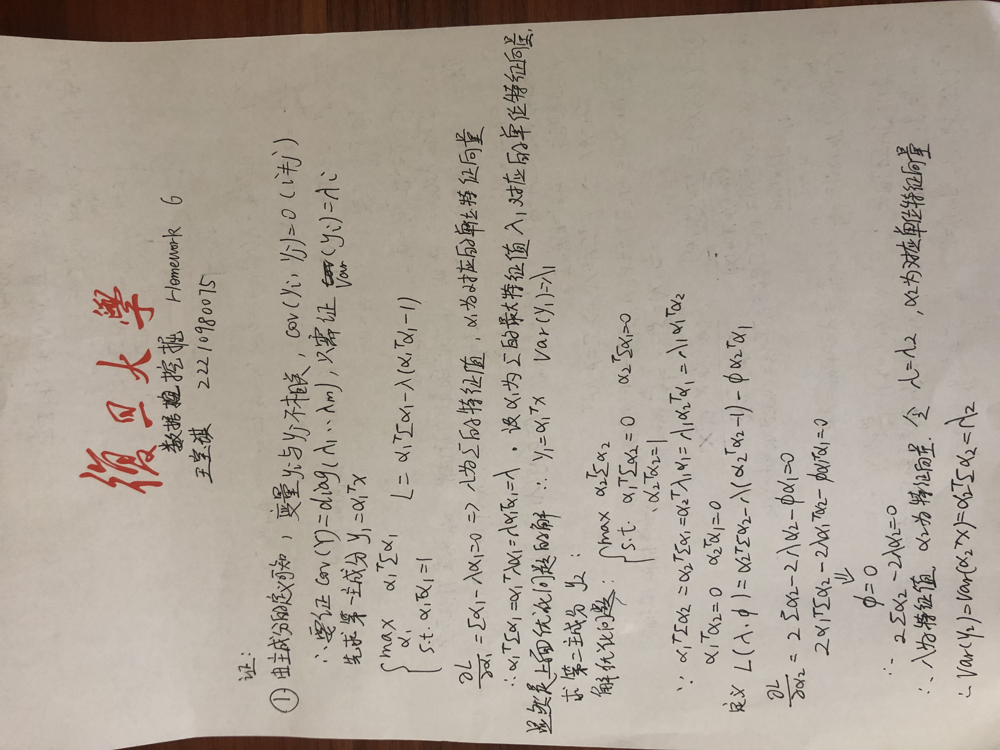

In [2]:
from IPython.display import Image
Image(filename="D:\研究生文件\course documents\数据挖掘\HW6\照片1.jpg")

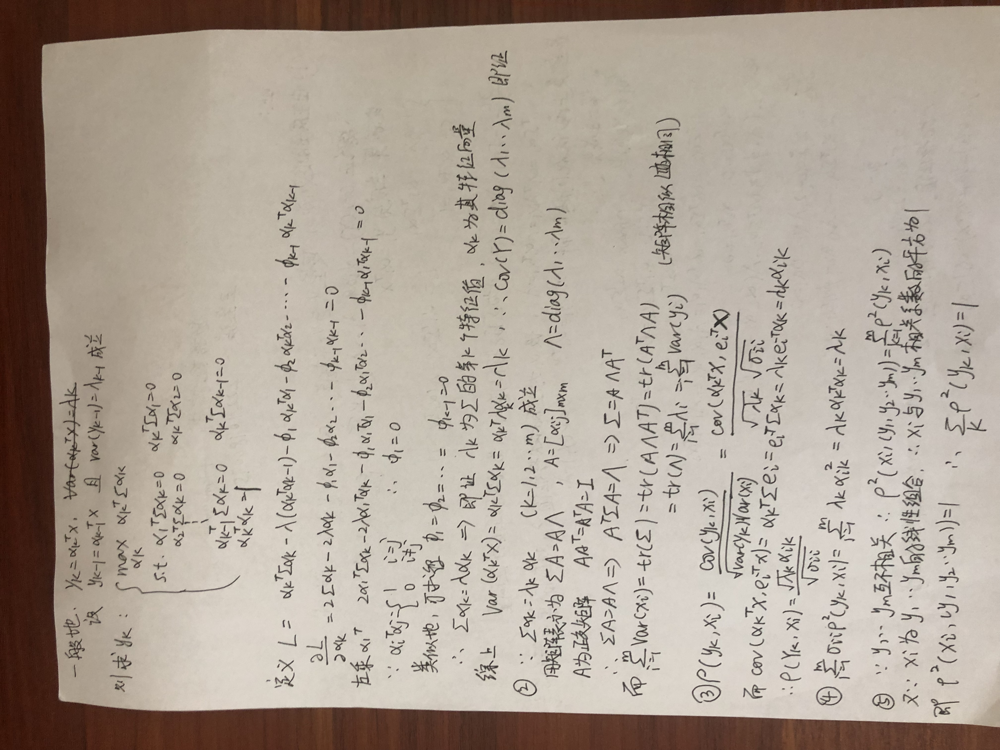

In [3]:
Image(filename="D:\研究生文件\course documents\数据挖掘\HW6\照片2.jpg")